# **Rayan International AI Contest**

<font color='white' style='font-family: "Times New Roman", Times, serif; font-size: 24px;'><strong>Machine Learning & Deep Learning Course</strong></font>

<font color='white' style='font-family: "Times New Roman", Times, serif; font-size: 20px;'><em>**Title**: Pytorch workshop || **Part**: 2</em></font>
<br><br>
<font color='white' size=1>Copyright 2019. Created by Jose Marcial Portilla.</font>

# Loading Real Image Data
Let's learn the real deal, and work from a varied collection of .jpg files.

For this section we'll be working with a version of the Cats vs. Dogs dataset inspired by a classic <a href='https://www.kaggle.com/c/dogs-vs-cats'>Kaggle competition</a>.<br>
A quick note - do <strong>not</strong> download the dataset from Kaggle! Ours is a cleaned version of the data without any 0by0 files, etc.<br>The images are similar to ones available from the <a href='http://www.image-net.org/'>ImageNet</a> database.

We have organized the files into train and test folders, and further divided the images into CAT and DOG subfolders. In this way the file path contains the label.

### Image files directory tree
<pre>.
└── Data
    └── CATS_DOGS
        ├── test
        │   ├── CAT
        │   │   ├── 9374.jpg
        │   │   ├── 9375.jpg
        │   │   └── ... (3,126 files)
        │   └── DOG
        │       ├── 9374.jpg
        │       ├── 9375.jpg
        │       └── ... (3,125 files)       
        │           
        └── train
            ├── CAT
            │   ├── 0.jpg
            │   ├── 1.jpg
            │   └── ... (9,371 files)
            └── DOG
                ├── 0.jpg
                ├── 1.jpg
                └── ... (9,372 files)</pre>

## Perform standard imports

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

## Examine the data
We'll us Python's built-in <a href='https://docs.python.org/3/library/os.html'>os module</a> to walk the directories collecting file names. We'll then use <a href='https://python-pillow.org/'>Pillow</a>, an extension to the Python Imaging Library (PIL), to open image files and extract image sizes. A pandas DataFrame will provide summary statistics on our data like max/min width & height from which we can choose our model parameters.

In [ ]:
import os
from PIL import Image
from IPython.display import display

# Filter harmless warnings
import warnings
warnings.filterwarnings("ignore")

In [ ]:
!gdown 1fuFurVV8rcrVTAFPjhQvzGLNdnTi1jWZ

Downloading...
From (original): https://drive.google.com/uc?id=1fuFurVV8rcrVTAFPjhQvzGLNdnTi1jWZ
From (redirected): https://drive.google.com/uc?id=1fuFurVV8rcrVTAFPjhQvzGLNdnTi1jWZ&confirm=t&uuid=b647fc9e-50ea-4d41-adef-5a35cc135dea
To: /content/CATS_DOGS.zip
100% 812M/812M [00:30<00:00, 27.0MB/s]


In [ ]:
!unzip -q CATS_DOGS.zip

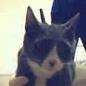

In [ ]:
# TEST YOUR VERSION OF PILLOW
# Run this cell. If you see a picture of a cat you're all set!
with Image.open('CATS_DOGS/test/CAT/10107.jpg') as im:
    display(im)

## Image Preprocessing
Any network we define requires consistent input data. That is, the incoming image files need to have the same number of channels (3 for red/green/blue), the same depth per channel (0-255), and the same height and width. This last requirement can be tricky. How do we transform an 800x450 pixel image into one that is 224x224?
* <a href='https://en.wikipedia.org/wiki/Aspect_ratio_(image)'><strong>aspect ratio</strong></a>: the ratio of width to height (16:9, 1:1, etc.) An 800x450 pixel image has an aspect ration of 16:9. We can change the aspect ratio of an image by cropping it, by stretching/squeezing it, or by some combination of the two. In both cases we lose some information contained in the original. Let's say we crop 175 pixels from the left and right sides of our 800x450 image, resulting in one that's 450x450.
* <strong>scale</strong>: Once we've attained the proper aspect ratio we may need to scale an image up or down to fit our input parameters. There are several libraries we can use to scale a 450x450 image down to 224x224 with minimal loss.
* <a href=''><strong>normalization</strong></a>: when images are converted to tensors, the [0,255] rgb channels are loaded into range [0,1]. We can then normalize them using the generally accepted values of mean=[0.485, 0.456, 0.406] and std=[0.229, 0.224, 0.225]. For the curious, these values were obtained by the PyTorch team using a random 10,000 sample of <a href='http://www.image-net.org/'>ImageNet</a> images. There's a good discussion of this <a href='https://discuss.pytorch.org/t/normalization-in-the-mnist-example/457/22'>here</a>, and the original source code can be found <a href='https://github.com/soumith/imagenet-multiGPU.torch/blob/master/donkey.lua#L154'>here</a>.

## Transformations
Before defining our Convolutional Network, let's look at a sample image and perform various transformations on it to see their effect.

(500, 387)


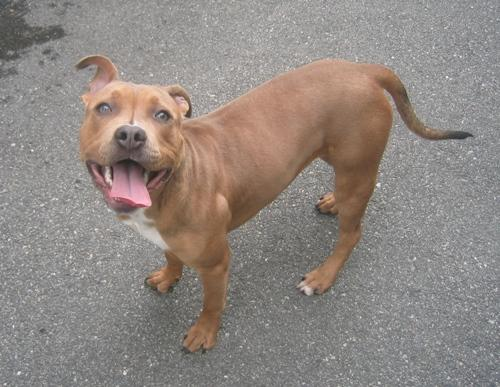

In [ ]:
dog = Image.open('CATS_DOGS/train/DOG/14.jpg')
print(dog.size)
display(dog)

This is how jupyter displays the original .jpg image. Note that size is given as (width, height).<br>
Let's look at a single pixel:

In [ ]:
type(dog)

PIL.JpegImagePlugin.JpegImageFile

In [ ]:
r, g, b = dog.getpixel((0, 0))
print(r,g,b)

90 95 98


The pixel at position [0,0] (upper left) of the source image has an rgb value of (90,95,98). This corresponds to <font style="background-color:rgb(90,95,98)">this color </font><br>
Great! Now let's look at some specific transformations.
### <a href='https://pytorch.org/docs/stable/torchvision/transforms.html#torchvision.transforms.ToTensor'><tt>transforms.ToTensor()</tt></a>
Converts a PIL Image or numpy.ndarray (HxWxC) in the range [0, 255] to a <tt>torch.FloatTensor</tt> of shape (CxHxW) in the range [0.0, 1.0]

torch.Size([3, 387, 500])


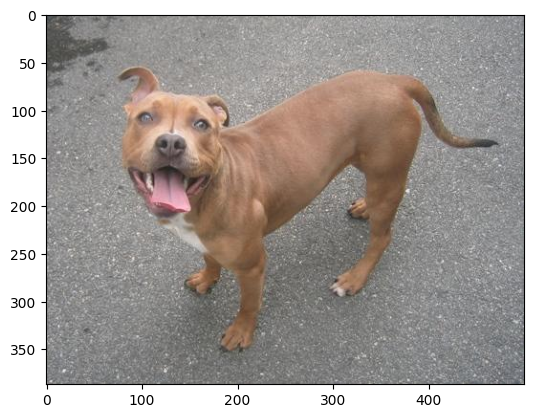

In [ ]:
transform = transforms.Compose([
    transforms.ToTensor()
])
im = transform(dog)
print(im.shape)
plt.imshow(np.transpose(im.numpy(), (1, 2, 0)));

This is the same image converted to a tensor and displayed using matplotlib. Note that the torch dimensions follow [channel, height, width]<br><br>
PyTorch automatically loads the [0,255] pixel channels to [0,1]:<br><br>
$\frac{90}{255}=0.3529\quad\frac{95}{255}=0.3725\quad\frac{98}{255}=0.3843$

In [ ]:
im[2,0,0]

tensor(0.3843)

### <a href='https://pytorch.org/docs/stable/torchvision/transforms.html#torchvision.transforms.Resize'><tt>transforms.Resize(<em>size</em>)</tt></a>
If size is a sequence like (h, w), the output size will be matched to this. If size is an integer, the smaller edge of the image will be matched to this number.<br>i.e, if height > width, then the image will be rescaled to (size * height / width, size)

torch.Size([3, 224, 224])


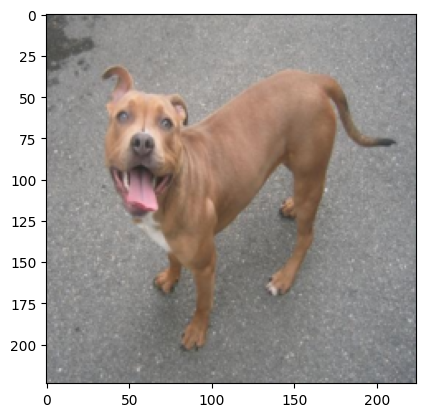

In [ ]:
transform = transforms.Compose([
transforms.Resize((224,224)),
    transforms.ToTensor(),

])
im = transform(dog)
print(im.shape)
plt.imshow(np.transpose(im.numpy(), (1, 2, 0)));

This resized the shortest side, and scaled the other. Let's try this on a small image.

(135, 102)


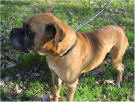

In [ ]:
small_dog = Image.open('CATS_DOGS/train/DOG/11.jpg')
print(small_dog.size)
display(small_dog)

torch.Size([3, 224, 224])


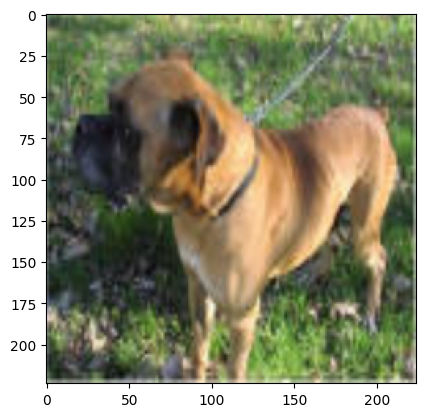

In [ ]:
im = transform(small_dog)
print(im.shape)
plt.imshow(np.transpose(im.numpy(), (1, 2, 0)));

### <a href='https://pytorch.org/docs/stable/torchvision/transforms.html#torchvision.transforms.CenterCrop'><tt>transforms.CenterCrop(<em>size</em>)</tt></a>
If size is an integer instead of sequence like (h, w), a square crop of (size, size) is made.

torch.Size([3, 224, 224])


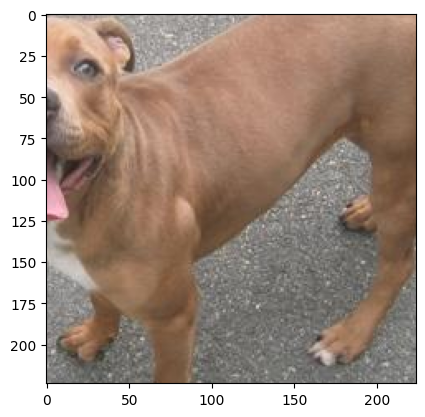

In [ ]:
transform = transforms.Compose([
    transforms.CenterCrop(224),
    transforms.ToTensor()
])
im = transform(dog) # this crops the original image
print(im.shape)
plt.imshow(np.transpose(im.numpy(), (1, 2, 0)));

It may be better to resize the image first, then crop:

torch.Size([3, 224, 224])


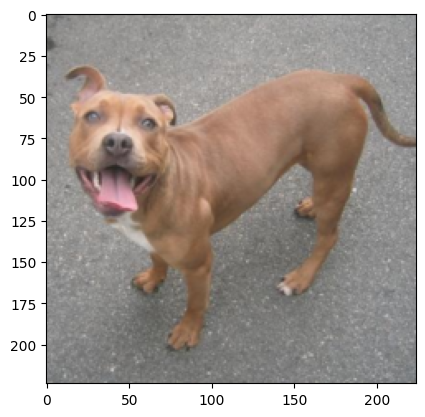

In [ ]:
transform = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.ToTensor()
])
im = transform(dog)
print(im.shape)
plt.imshow(np.transpose(im.numpy(), (1, 2, 0)));

## Other affine transformations
An <a href='https://en.wikipedia.org/wiki/Affine_transformation'><em>affine</em></a> transformation is one that preserves points and straight lines. Examples include rotation, reflection, and scaling. For instance, we can double the effective size of our training set simply by flipping the images.
### <a href='https://pytorch.org/docs/stable/torchvision/transforms.html#torchvision.transforms.RandomHorizontalFlip'><tt>transforms.RandomHorizontalFlip(<em>p=0.5</em>)</tt></a>
Horizontally flip the given PIL image randomly with a given probability.

torch.Size([3, 387, 500])


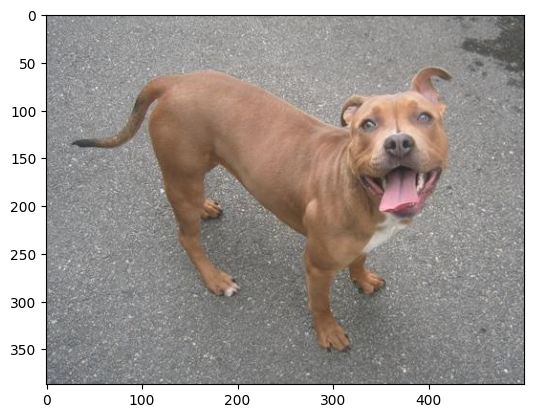

In [ ]:
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(p=1),  # normally we'd set p=0.5
    transforms.ToTensor()
])
im = transform(dog)
print(im.shape)
plt.imshow(np.transpose(im.numpy(), (1, 2, 0)));

### <a href='https://pytorch.org/docs/stable/torchvision/transforms.html#torchvision.transforms.RandomRotation'><tt>transforms.RandomRotation(<em>degrees</em>)</tt></a>
If degrees is a number instead of sequence like (min, max), the range of degrees will be (-degrees, +degrees).<br>
Run the cell below several times to see a sample of rotations.

torch.Size([3, 387, 500])


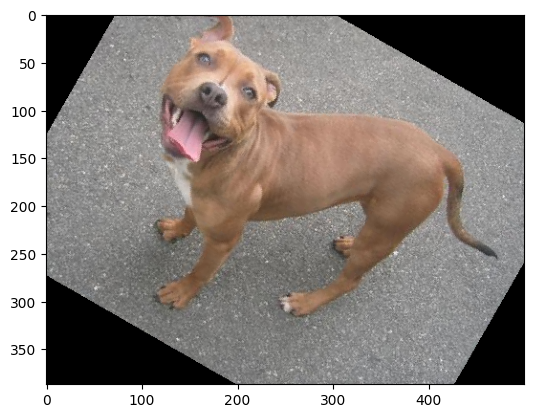

In [ ]:
transform = transforms.Compose([
    transforms.RandomRotation(30),  # rotate randomly between +/- 30 degrees
    transforms.ToTensor()
])
im = transform(dog)
print(im.shape)
plt.imshow(np.transpose(im.numpy(), (1, 2, 0)));

### Scaling is done using <a href='https://pytorch.org/docs/stable/torchvision/transforms.html#torchvision.transforms.Resize'><tt>transforms.Resize(<em>size</em>)</tt></a>

torch.Size([3, 224, 224])


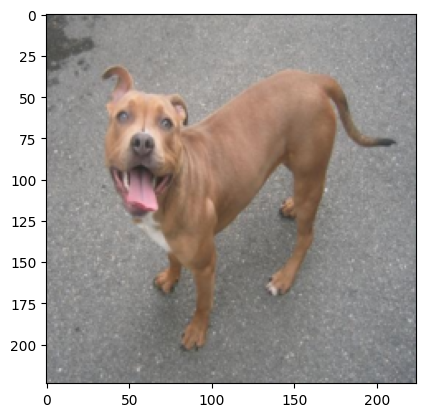

In [ ]:
transform = transforms.Compose([
    transforms.Resize((224,224)),  # be sure to pass in a list or a tuple
    transforms.ToTensor()
])
im = transform(dog)
print(im.shape)
plt.imshow(np.transpose(im.numpy(), (1, 2, 0)));

## Let's put it all together

torch.Size([3, 224, 224])


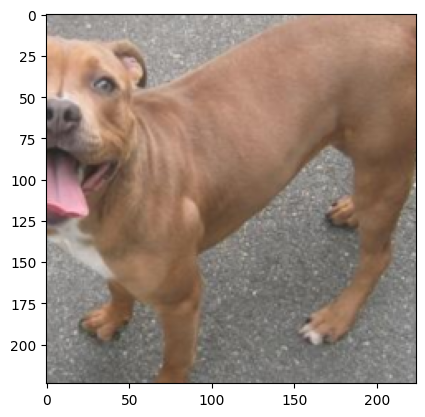

In [ ]:
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),  # normally we'd set p=0.5
    transforms.CenterCrop(256),
    transforms.Resize(224),

    transforms.ToTensor()
])
im = transform(dog)
print(im.shape)
plt.imshow(np.transpose(im.numpy(), (1, 2, 0)));

___
## Normalization
Once the image has been loaded into a tensor, we can perform normalization on it. This serves to make convergence happen quicker during training. The values are somewhat arbitrary - you can use a mean of 0.5 and a standard deviation of 0.5 to convert a range of [0,1] to [-1,1], for example.<br>However, <a href='https://discuss.pytorch.org/t/normalization-in-the-mnist-example/457/22'>research has shown</a> that mean=[0.485, 0.456, 0.406] and std=[0.229, 0.224, 0.225] work well in practice.

### <a href='https://pytorch.org/docs/stable/torchvision/transforms.html#torchvision.transforms.Normalize'><tt>transforms.Normalize(<em>mean, std</em>)</tt></a>
Given mean: (M1,...,Mn) and std: (S1,..,Sn) for n channels, this transform will normalize each channel of the input tensor
### $\quad\textrm {input[channel]} = \frac{\textrm{input[channel] - mean[channel]}}{\textrm {std[channel]}}$

torch.Size([3, 387, 500])


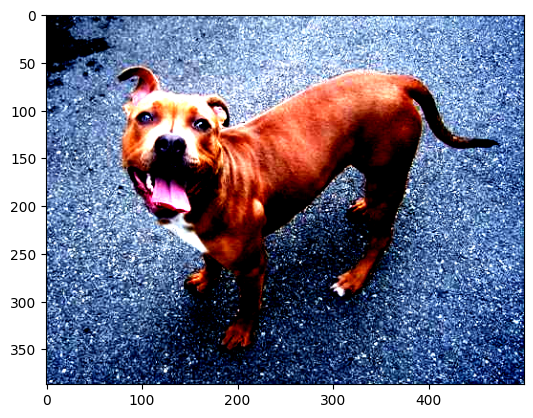

In [ ]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])
# transform = transforms.Compose([
#     transforms.ToTensor(),
#     transforms.Normalize([0.5, 0.5, 0.5],
#                          [0.5, 0.5, 0.5])
# ])
im = transform(dog)
print(im.shape)
plt.imshow(np.transpose(im.numpy(), (1, 2, 0)));

Recall that before normalization, the upper-leftmost tensor had pixel values of <tt>[0.3529, 0.3725, 0.3843]</tt>.<br>
With normalization we subtract the channel mean from the input channel, then divide by the channel std.<br><br>
$\frac{(0.3529-0.485)}{0.229}=-0.5767\quad\frac{(0.3725-0.456)}{0.224}=-0.3725\quad\frac{(0.3843-0.406)}{0.225}=-0.0964$<br>

In [ ]:
# After normalization:
im[:,0,0]

tensor([-0.5767, -0.3725, -0.0964])

When displayed, matplotlib clipped this particular pixel up to [0,0,0] so it appears black on the screen. However, the appearance isn't important; the goal of normalization is improved mathematical performance.

### Optional: De-normalize the images
To see the image back in its true colors, we can apply an inverse-transform to the tensor being displayed.

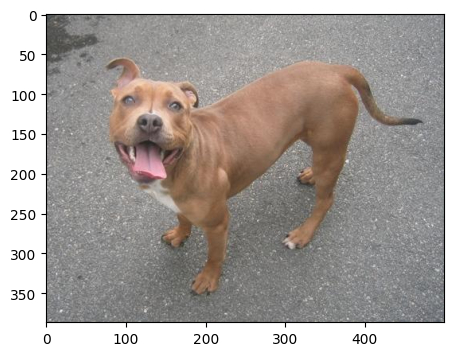

In [ ]:
inv_normalize = transforms.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
    std=[1/0.229, 1/0.224, 1/0.225]
)
im_inv = inv_normalize(im)
plt.figure(figsize=(12,4))
plt.imshow(np.transpose(im_inv.numpy(), (1, 2, 0)));

Note that the original tensor was not modified:

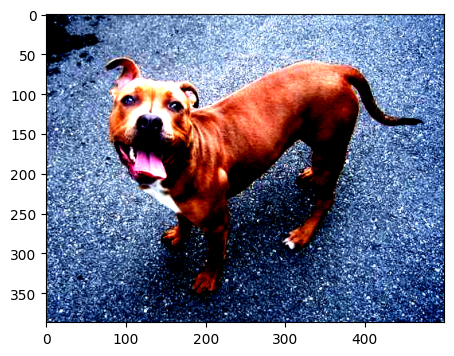

In [ ]:
plt.figure(figsize=(12,4))
plt.imshow(np.transpose(im.numpy(), (1, 2, 0)));

Custom transform
https://pytorch.org/tutorials/beginner/data_loading_tutorial.html

In [ ]:
class Rescale(object):
    def __init__(self, output_size):
        assert isinstance(output_size, (int, tuple))
        self.output_size = output_size

    def __call__(self, sample):
        img=sample.resize((self.output_size,self.output_size))


        return img


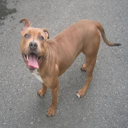

In [ ]:
rescale_transform=Rescale(128)
im_new=rescale_transform(dog)
im_new

 Now let's perform CNN on real images!

# CNN on Custom Images
For this exercise we're using a collection of Cats and Dogs images inspired by the classic <a href='https://www.kaggle.com/c/dogs-vs-cats'>Kaggle competition</a>.

In the last section we downloaded the files, looked at the directory structure, examined the images, and performed a variety of transforms in preparation for training.

In this section we'll define our model, then feed images through a training and validation sequence using DataLoader.



## Perform standard imports

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models # add models to the list
from torchvision.utils import make_grid
import os
from tqdm import tqdm

from torch.utils.data import Dataset
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from PIL import Image
# ignore harmless warnings
import warnings
warnings.filterwarnings("ignore")
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

## Define transforms
In the previous section we looked at a variety of transforms available for data augmentation (rotate, flip, etc.) and normalization.<br>
Here we'll combine the ones we want, including the <a href='https://discuss.pytorch.org/t/normalization-in-the-mnist-example/457/22'>recommended normalization parameters</a> for mean and std per channel.

In [ ]:
train_transform = transforms.Compose([
        transforms.RandomRotation(10),      # rotate +/- 10 degrees
        transforms.RandomHorizontalFlip(),  # reverse 50% of images
        transforms.Resize(224),             # resize shortest side to 224 pixels
        transforms.CenterCrop(224),         # crop longest side to 224 pixels at center
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ])

test_transform = transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ])

## Prepare train and test sets, loaders


A dataset is an abstract class in PyTorch that represents a collection of data. It is responsible for loading and preprocessing data from a source and returning it in the form of a PyTorch tensor.

The Dataset class provides two main methods:


1.   len: returns the length of the dataset
2.   getitem: returns a single data point from the dataset at a given index

The getitem method is where the actual data loading and preprocessing takes place. It takes an index as input and returns a data point, which can be a tensor or a dictionary of tensors. This method is used by the DataLoader class to load and preprocess the data.

We're going to take advantage of a built-in torchvision dataset tool called <a href='https://pytorch.org/docs/stable/torchvision/datasets.html#imagefolder'><tt><strong>ImageFolder</strong></tt></a>.


In [ ]:
class CustomDataset(Dataset):
    def __init__(self, root, transform=None, target_transform=None):
        # Initializing Captcha Dataset class
        super(CustomDataset, self).__init__()
        self.root=root
        # Listing all files in the provided root directory
        self.cat_files = sorted(os.listdir(root+"/CAT"))
        self.dog_files = sorted(os.listdir(root+"/DOG"))
        # Initializing lists to store images and their respective labels
        self.images = []
        self.labels = []
        self.transform=transform
        self.target_transform=target_transform

        # Iterating through each file in the root directory
        for img in self.cat_files:
            # Checking if the file is an image file
            if self.is_image_file(img):
                label = 0
                # Storing image path and label
                self.images.append(os.path.join(self.root,"CAT", img))
                self.labels.append(label)
        for img in self.dog_files:
            # Checking if the file is an image file
            if self.is_image_file(img):
                label = 1
                # Storing image path and label
                self.images.append(os.path.join(self.root,"DOG", img))
                self.labels.append(label)

    def __len__(self):
        # Returning the total number of images
        return len(self.labels)

    def __getitem__(self, idx:int):
        # Retrieving image and target label based on index
        img, target = self.images[idx], self.labels[idx]

        # Checking if the index is a slice (multiple items requested)
        if isinstance(idx, slice):
            tmp = []
            # Iterating through each image in the slice
            for item in img:
                # Applying transformations if specified
                if self.transform is not None:
                    tmp.append(self.transform(self.read_image(item)))
                else:
                    tmp.append(self.read_image(item))
            img = tmp
        else:
            # Applying transformations if specified
            if self.transform is not None:
                img = self.transform(self.read_image(img))
            else:
                img = self.read_image(img)

        return img, target

    # Method to read image from file path
    def read_image(self, path):
        img = Image.open(path)
        # Converting image to RGB format
        return img.convert('RGB')

    # Method to check if a file is an image file
    def is_image_file(self, filename):
        # Checking if filename ends with any of the specified image extensions
        return any(filename.endswith(extension) for extension in [".jpg", ".jpeg", ".png"])

In [ ]:
train_data=CustomDataset('CATS_DOGS/train',transform=train_transform)
test_data=CustomDataset('CATS_DOGS/test',transform=test_transform)

train_data[0]

(tensor([[[ 2.1804,  2.1804,  2.1804,  ..., -2.1179, -2.1179, -2.1179],
          [ 2.1975,  2.1975,  2.1975,  ..., -2.1179, -2.1179, -2.1179],
          [ 2.2147,  2.2147,  2.2147,  ..., -2.1179, -2.1179, -2.1179],
          ...,
          [-2.1179, -2.1179, -2.1179,  ...,  0.0056,  0.1254,  0.2796],
          [-2.1179, -2.1179, -2.1179,  ...,  0.0398,  0.1597,  0.2796],
          [-2.1179, -2.1179, -2.1179,  ...,  0.1083,  0.2111,  0.3309]],
 
         [[ 2.0084,  2.0084,  2.0084,  ..., -2.0357, -2.0357, -2.0357],
          [ 2.0259,  2.0259,  2.0259,  ..., -2.0357, -2.0357, -2.0357],
          [ 2.0434,  2.0434,  2.0434,  ..., -2.0357, -2.0357, -2.0357],
          ...,
          [-2.0357, -2.0357, -2.0357,  ..., -0.3550, -0.2500, -0.1099],
          [-2.0357, -2.0357, -2.0357,  ..., -0.3375, -0.2150, -0.1099],
          [-2.0357, -2.0357, -2.0357,  ..., -0.2675, -0.1625, -0.0574]],
 
         [[ 1.1237,  1.1237,  1.1411,  ..., -1.8044, -1.8044, -1.8044],
          [ 1.1411,  1.1585,

In [ ]:
root = 'CATS_DOGS'

train_data = datasets.ImageFolder(os.path.join(root, 'train'), transform=train_transform)
test_data = datasets.ImageFolder(os.path.join(root, 'test'), transform=test_transform)

# DATALOADER

The DataLoader is a PyTorch utility class that provides a way to iterate over a Dataset object in batches. It is designed to handle large datasets efficiently and can be configured to load data in parallel, preprocess data on the fly, and shuffle data for each epoch.

The DataLoader takes in a Dataset object and provides a number of configuration options, including batch size, shuffling, and number of worker processes for parallel data loading. The DataLoader class is responsible for batching the data and returning it in a format that can be consumed by the model


###Sampler

A Sampler is a PyTorch module that provides an indexing strategy for a dataset. It is responsible for determining which samples from the dataset should be included in each batch.

There are two types of samplers available in PyTorch: SequentialSampler and RandomSampler. The SequentialSampler samples data from the dataset in sequential order, while the RandomSampler samples data randomly from the dataset.

In addition to these two samplers, PyTorch also provides a variety of other samplers that can be used for specific use cases, such as the SubsetRandomSampler, which samples data randomly from a subset of the dataset.


###Batch

The batch is the basic unit of data used by deep learning models. The batch is typically a tensor of shape (batch_size, input_shape), where batch_size is the number of data points in the batch and input_shape is the shape of the input data.

The DataLoader class is responsible for batching the data from the Dataset object and returning it in a format that can be consumed by the model. The batch size can be configured using the batch_size argument when creating a DataLoader object.


###Parallelism

Parallelism is a key feature of the PyTorch DataLoader architecture. The DataLoader class is designed to handle large datasets efficiently by allowing for parallel data loading and preprocessing.

Parallelism can be achieved in two ways:

1.   Using multiple worker processes to load and preprocess data in parallel
2.   Using a multi-threaded or multi-process data loader to load data in parallel



By default, the DataLoader class uses a single worker process to load and preprocess data. However, it can be configured to use multiple worker processes by setting the num_workers argument when creating a DataLoader object.


###Shuffling

Shuffling is the process of randomly reordering the data in a dataset. Shuffling is important for training deep learning models because it prevents the model from overfitting to the order of the data. The PyTorch DataLoader class provides a way to shuffle the data for each epoch.

The DataLoader class can be configured to shuffle the data by setting the shuffle argument to True when creating a DataLoader object. When shuffling is enabled, the DataLoader class randomly shuffles the indices of the data points and returns the data in a random order for each epoch.

###Caching

Caching is the process of storing data in memory or on disk to improve performance. Caching can be useful when working with large datasets that take a long time to load and preprocess.

The PyTorch DataLoader class provides a way to cache data using the pin_memory argument. When pin_memory is set to True, the DataLoader class caches the data in pinned memory, which is memory that can be accessed by the GPU. This can improve performance by reducing the time it takes to transfer data from CPU to GPU memory.



###Iteration
The PyTorch DataLoader class provides a simple interface for iterating over the data in a dataset.

https://pytorch.org/docs/stable/data.html

In [ ]:
torch.manual_seed(42)
batch_size=10
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False)

class_names=["CAT","DOG"]
print(f'Training images available: {len(train_data)}')
print(f'Testing images available:  {len(test_data)}')

Training images available: 18743
Testing images available:  6251


In [ ]:
b=next(iter(train_loader))
b

[tensor([[[[-1.8953, -1.8782, -1.8953,  ..., -2.1179, -2.1179, -2.1179],
           [-1.8953, -1.8782, -1.8953,  ..., -2.1179, -2.1179, -2.1179],
           [-1.8953, -1.8782, -1.9124,  ..., -2.1179, -2.1179, -2.1179],
           ...,
           [-2.1179, -2.1179, -2.1179,  ..., -1.7925, -1.7754, -1.7925],
           [-2.1179, -2.1179, -2.1179,  ..., -1.7925, -1.7925, -1.8097],
           [-2.1179, -2.1179, -2.1179,  ..., -1.8097, -1.8097, -1.8268]],
 
          [[-1.7206, -1.7031, -1.7206,  ..., -2.0357, -2.0357, -2.0357],
           [-1.7381, -1.7206, -1.7381,  ..., -2.0357, -2.0357, -2.0357],
           [-1.7731, -1.7556, -1.7906,  ..., -2.0357, -2.0357, -2.0357],
           ...,
           [-2.0357, -2.0357, -2.0357,  ..., -1.6681, -1.6506, -1.6681],
           [-2.0357, -2.0357, -2.0357,  ..., -1.6681, -1.6681, -1.6856],
           [-2.0357, -2.0357, -2.0357,  ..., -1.6856, -1.6856, -1.7031]],
 
          [[-1.5256, -1.5081, -1.5256,  ..., -1.8044, -1.8044, -1.8044],
           [-

## Display a batch of images
To verify that the training loader selects cat and dog images at random, let's show a batch of loaded images.<br>
Recall that imshow clips pixel values <0, so the resulting display lacks contrast. We'll apply a quick inverse transform to the input tensor so that images show their "true" colors.

Label: [1 0 0 1 0 1 1 0 0 0]
Class: DOG CAT CAT DOG CAT DOG DOG CAT CAT CAT


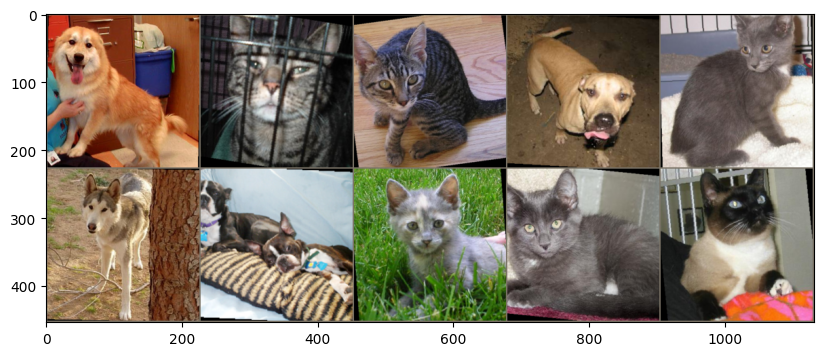

In [ ]:
# Grab the first batch of 10 images
for images,labels in train_loader:
    break

# Print the labels
print('Label:', labels.numpy())
print('Class:', *np.array([class_names[i] for i in labels]))

im = make_grid(images, nrow=5)  # the default nrow is 8
# Inverse normalize the images
inv_normalize = transforms.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
    std=[1/0.229, 1/0.224, 1/0.225]
)
im_inv = inv_normalize(im)

# Print the images
plt.figure(figsize=(12,4))
plt.imshow(np.transpose(im_inv.numpy(), (1, 2, 0)));

## Define the model
Here we have a binary classification (2 output channels). So let's define the model.

In [ ]:
class ConvolutionalNetwork(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=(3,3), stride=1, padding=1)
        self.act1 = nn.ReLU()
        self.drop1 = nn.Dropout(0.3)
        self.pool1 = nn.MaxPool2d(kernel_size=(2, 2))

        self.conv2 = nn.Conv2d(32, 32, kernel_size=(3,3), stride=1, padding=1)
        self.act2 = nn.ReLU()
        self.pool2 = nn.MaxPool2d(kernel_size=(2, 2))

        self.conv3 = nn.Conv2d(32, 32, kernel_size=(3,3), stride=1, padding=1)
        self.act3 = nn.ReLU()
        self.pool3 = nn.MaxPool2d(kernel_size=(2, 2))

        self.flat = nn.Flatten()

        self.fc4 = nn.Linear(28*28*32, 512)
        self.act4 = nn.ReLU()
        self.drop4 = nn.Dropout(0.5)

        self.fc5= nn.Linear(512, 2)

    def forward(self, x):
        x = self.pool1(self.drop1(self.act1(self.conv1(x))))

        x = self.pool2(self.act2(self.conv2(x)))
        x = self.pool3(self.act3(self.conv3(x)))
        x = self.flat(x)

        x = self.act4(self.fc4(x))
        x = self.drop4(x)
        x = self.fc5(x)
        return x

In [ ]:
test_model=ConvolutionalNetwork()
sample=torch.randn(10,3,224,224)
res=test_model(sample)
res.sum().backward()

<div class="alert alert-info"><strong>Why <tt>(54x54x16)</tt>?</strong><br>
With 224 pixels per side, the kernels and pooling layers result in $\;(((224-2)/2)-2)/2 = 54.5\;$ which rounds down to 54 pixels per side.</div>

### Instantiate the model, define loss and optimization functions
We're going to call our model "CNNmodel" to differentiate it from an "AlexNetmodel" we'll use later.

In [ ]:
torch.manual_seed(101)
CNNmodel = ConvolutionalNetwork().to(DEVICE)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(CNNmodel.parameters(), lr=0.001)
CNNmodel

ConvolutionalNetwork(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (act1): ReLU()
  (drop1): Dropout(p=0.3, inplace=False)
  (pool1): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (act2): ReLU()
  (pool2): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (act3): ReLU()
  (pool3): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (flat): Flatten(start_dim=1, end_dim=-1)
  (fc4): Linear(in_features=25088, out_features=512, bias=True)
  (act4): ReLU()
  (drop4): Dropout(p=0.5, inplace=False)
  (fc5): Linear(in_features=512, out_features=2, bias=True)
)

### Looking at the trainable parameters

In [ ]:
def count_parameters(model):
    params = [p.numel() for p in model.parameters() if p.requires_grad]
    for item in params:
        print(f'{item:>8}')
    print(f'________\n{sum(params):>8}')

In [ ]:
count_parameters(CNNmodel)

     864
      32
    9216
      32
    9216
      32
12845056
     512
    1024
       2
________
12865986


## Train the model
In the interests of time, we'll limit the number of training batches to 800, and the number of testing batches to 300. We'll train the model on 8000 of 18743 available images, and test it on 3000 out of 6251 images.

In [ ]:
def accuracy(out, y_batch):
    return (torch.argmax(out, dim=1)==y_batch).float().mean()

In [ ]:
import time
start_time = time.time()
epochs = 1
batch_size=32
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False)


train_losses = []
test_losses = []
train_correct = []
test_correct = []

for i in range(epochs):
    trn_corr = 0
    tst_corr = 0
    # Run the training batches
    running_loss=0.
    for b, (X_train, y_train) in enumerate(tqdm(train_loader)):
        X_train=X_train.to(DEVICE)
        y_train=y_train.to(DEVICE)
        y_pred = CNNmodel(X_train)
        loss = criterion(y_pred, y_train)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        running_loss+=loss.item()
        # Print interim results
        if b%100 == 0:
            print(f'epoch: {i:2}  batch: {b:4} [{batch_size*b:6}]  loss: {loss.item():10.8f}')

    train_losses.append(running_loss/len(train_loader))
    print(f'end of epoch: {i:2} loss: {running_loss/len(train_loader):10.8f}')
    # Run the testing batches
    with torch.no_grad():
        val_acc=0.
        val_running_loss=0.0
        CNNmodel.eval()
        for b, (X_test, y_test) in enumerate(test_loader):
            # Limit the number of batches
            X_test=X_test.to(DEVICE)
            y_test=y_test.to(DEVICE)
            y_val = CNNmodel(X_test)
            btch_acc=accuracy(y_val, y_test)
            val_acc+=btch_acc.item()
            loss = criterion(y_val, y_test)
            val_running_loss+=loss.item()
        print(f'validation accuracy:{val_acc/len(test_loader)}')
        CNNmodel.train()
    test_losses.append(val_running_loss/len(test_loader))
    test_correct.append(val_acc/len(test_loader))

print(f'\nDuration: {time.time() - start_time:.0f} seconds') # print the time elapsed

  0%|          | 1/586 [00:01<14:26,  1.48s/it]

epoch:  0  batch:    0 [     0]  loss: 0.68547118


 17%|█▋        | 101/586 [00:22<01:36,  5.04it/s]

epoch:  0  batch:  100 [  3200]  loss: 0.75504023


 34%|███▍      | 201/586 [00:43<01:19,  4.85it/s]

epoch:  0  batch:  200 [  6400]  loss: 0.64269108


 51%|█████▏    | 301/586 [01:04<00:57,  4.99it/s]

epoch:  0  batch:  300 [  9600]  loss: 0.65838224


 69%|██████▊   | 402/586 [01:25<00:35,  5.15it/s]

epoch:  0  batch:  400 [ 12800]  loss: 0.56359172


 85%|████████▌ | 501/586 [01:46<00:16,  5.19it/s]

epoch:  0  batch:  500 [ 16000]  loss: 0.58713299


100%|██████████| 586/586 [02:03<00:00,  4.75it/s]


end of epoch:  0 loss: 0.64173398
validation accuracy:0.6618448517152241

Duration: 150 seconds


## Save the trained model

In [ ]:
torch.save(CNNmodel.state_dict(), 'CustomImageCNNModel.pt')

## Evaluate model performance

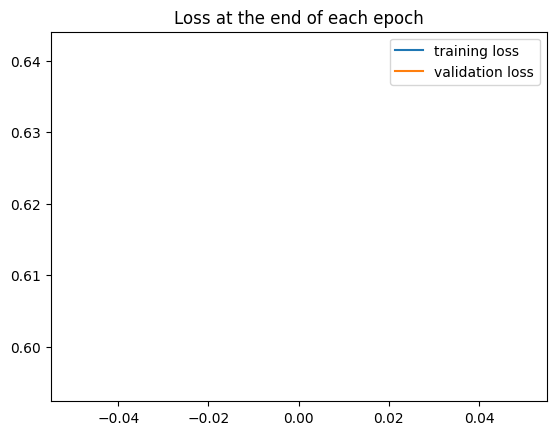

In [ ]:
plt.plot(train_losses, label='training loss')
plt.plot(test_losses, label='validation loss')
plt.title('Loss at the end of each epoch')
plt.legend();

## Download a pretrained model
Torchvision has a number of proven models available through <a href='https://pytorch.org/docs/stable/torchvision/models.html#classification'><tt><strong>torchvision.models</strong></tt></a>:
<ul>
<li><a href="https://arxiv.org/abs/1404.5997">AlexNet</a></li>
<li><a href="https://arxiv.org/abs/1409.1556">VGG</a></li>
<li><a href="https://arxiv.org/abs/1512.03385">ResNet</a></li>
<li><a href="https://arxiv.org/abs/1602.07360">SqueezeNet</a></li>
<li><a href="https://arxiv.org/abs/1608.06993">DenseNet</a></li>
<li><a href="https://arxiv.org/abs/1512.00567">Inception</a></li>
<li><a href="https://arxiv.org/abs/1409.4842">GoogLeNet</a></li>
<li><a href="https://arxiv.org/abs/1807.11164">ShuffleNet</a></li>
<li><a href="https://arxiv.org/abs/1801.04381">MobileNet</a></li>
<li><a href="https://arxiv.org/abs/1611.05431">ResNeXt</a></li>
</ul>
These have all been trained on the <a href='http://www.image-net.org/'>ImageNet</a> database of images. Our only task is to reduce the output of the fully connected layers from (typically) 1000 categories to just 2.

To access the models, you can construct a model with random weights by calling its constructor:<br>
<pre>resnet18 = models.resnet18()</pre>
You can also obtain a pre-trained model by passing pretrained=True:<br>
<pre>resnet18 = models.resnet18(pretrained=True)</pre>
All pre-trained models expect input images normalized in the same way, i.e. mini-batches of 3-channel RGB images of shape (3 x H x W), where H and W are expected to be at least 224. The images have to be loaded in to a range of [0, 1] and then normalized using mean = [0.485, 0.456, 0.406] and std = [0.229, 0.224, 0.225].

Feel free to investigate the different models available. Each one will be downloaded to a cache directory the first time they're accessed - from then on they'll be available locally.

For its simplicity and effectiveness, we'll use AlexNet:

In [ ]:
AlexNetmodel = models.alexnet(pretrained=True).to(DEVICE)
AlexNetmodel

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 131MB/s]


AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

<div class="alert alert-info">This model uses <a href='https://pytorch.org/docs/master/nn.html#torch.nn.AdaptiveAvgPool2d'><tt><strong>torch.nn.AdaptiveAvgPool2d(<em>output_size</em>)</strong></tt></a> to convert the large matrix coming out of the convolutional layers to a (6x6)x256 matrix being fed into the fully connected layers.</div>

## Freeze feature parameters
We want to freeze the pre-trained weights & biases. We set <tt>.requires_grad</tt> to False so we don't backprop through them.

In [ ]:
for param in AlexNetmodel.parameters():
    param.requires_grad = False

## Modify the classifier
Next we need to modify the fully connected layers to produce a binary output. The section is labeled "classifier" in the AlexNet model.<br>
Note that when we assign new layers, their parameters default to <tt>.requires_grad=True</tt>.

In [ ]:
torch.manual_seed(42)
AlexNetmodel.classifier = nn.Sequential(nn.Linear(9216, 1024),
                                 nn.ReLU(),
                                 nn.Dropout(0.4),
                                 nn.Linear(1024, 2),).to(DEVICE)
AlexNetmodel

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Linear(in_features=9216, out_features=1024, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.4, 

In [ ]:
# These are the TRAINABLE parameters:
count_parameters(AlexNetmodel)

 9437184
    1024
    2048
       2
________
 9440258


## Define loss function & optimizer
We only want to optimize the classifier parameters, as the feature parameters are frozen.

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(AlexNetmodel.classifier.parameters(), lr=0.001)

## Train the model
Remember, we're only training the fully connected layers. The convolutional layers have fixed weights and biases. For this reason, we only need to run one epoch.

In [ ]:
import time
start_time = time.time()

epochs = 1

max_trn_batch = 800
max_tst_batch = 300

train_losses = []
test_losses = []
train_correct = []
test_correct = []

for i in range(epochs):
    trn_corr = 0
    tst_corr = 0

    # Run the training batches
    for b, (X_train, y_train) in enumerate(tqdm(train_loader)):
        if b == max_trn_batch:
            break
        b+=1
        X_train=X_train.to(DEVICE)
        y_train=y_train.to(DEVICE)
        # Apply the model
        y_pred = AlexNetmodel(X_train)
        loss = criterion(y_pred, y_train)

        # Tally the number of correct predictions
        predicted = torch.max(y_pred.data, 1)[1]
        batch_corr = (predicted == y_train).sum()
        trn_corr += batch_corr

        # Update parameters
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Print interim results
        if b%200 == 0:
            print(f'epoch: {i:2}  batch: {b:4} [{batch_size*b:6}]  loss: {loss.item():10.8f}  \
accuracy: {trn_corr.item()*100/(batch_size*b):7.3f}%')

    train_losses.append(loss.item())
    train_correct.append(trn_corr.item())

    # Run the testing batches
    with torch.no_grad():
        for b, (X_test, y_test) in enumerate(tqdm(test_loader)):
            X_test, y_test=X_test.to(DEVICE),y_test.to(DEVICE)
            if b == max_tst_batch:
                break

            # Apply the model
            y_val = AlexNetmodel(X_test)

            # Tally the number of correct predictions
            predicted = torch.max(y_val.data, 1)[1]
            tst_corr += (predicted == y_test).sum()

    loss = criterion(y_val, y_test)
    test_losses.append(loss.item())
    test_correct.append(tst_corr.item())

print(f'\nDuration: {time.time() - start_time:.0f} seconds') # print the time elapsed

 34%|███▍      | 201/586 [00:31<00:57,  6.74it/s]

epoch:  0  batch:  200 [  6400]  loss: 0.11384778  accuracy:  91.625%


 68%|██████▊   | 400/586 [01:02<00:41,  4.51it/s]

epoch:  0  batch:  400 [ 12800]  loss: 0.10225759  accuracy:  93.258%


100%|██████████| 196/196 [00:24<00:00,  7.84it/s]


Duration: 117 seconds


In [ ]:
print(test_correct)
print(f'Test accuracy: {test_correct[-1]*100/len(test_data):.3f}%')

[5947]
Test accuracy: 95.137%


## Run a new image through the model
We can also pass a single image through the model to obtain a prediction.<br>
Pick a number from 0 to 6250, assign it to "x", and we'll use that value to select an image from the Cats and Dogs test set.

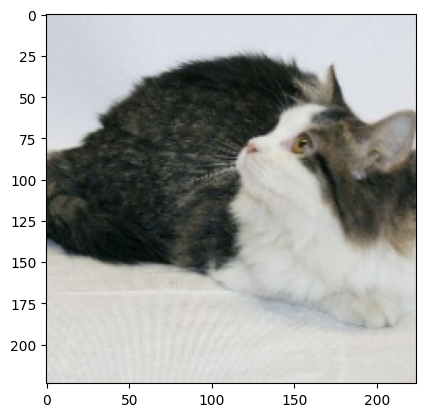

In [ ]:
x = 2019
im = inv_normalize(test_data[x][0])
plt.imshow(np.transpose(im.numpy(), (1, 2, 0)));

In [ ]:
test_data[x][0].shape

torch.Size([3, 224, 224])

In [ ]:
# CNN Model Prediction:

CNNmodel.eval()
with torch.no_grad():
    new_pred = CNNmodel(test_data[x][0].view(1,3,224,224).to(DEVICE)).argmax()
print(f'Predicted value: {new_pred.item()} {class_names[new_pred.item()]}')

Predicted value: 0 CAT


In [ ]:
# AlexNet Model Prediction:

AlexNetmodel.eval()
with torch.no_grad():
    new_pred = AlexNetmodel(test_data[x][0].view(1,3,224,224).to(DEVICE)).argmax()
print(f'Predicted value: {new_pred.item()} {class_names[new_pred.item()]}')

Predicted value: 0 CAT


In [ ]:
AlexNetmodel.eval()
with torch.no_grad():
    feature_maps = AlexNetmodel.features[0](test_data[x][0].view(1,3,224,224).to(DEVICE)).cpu()

In [ ]:
print(feature_maps.shape)

torch.Size([1, 64, 55, 55])


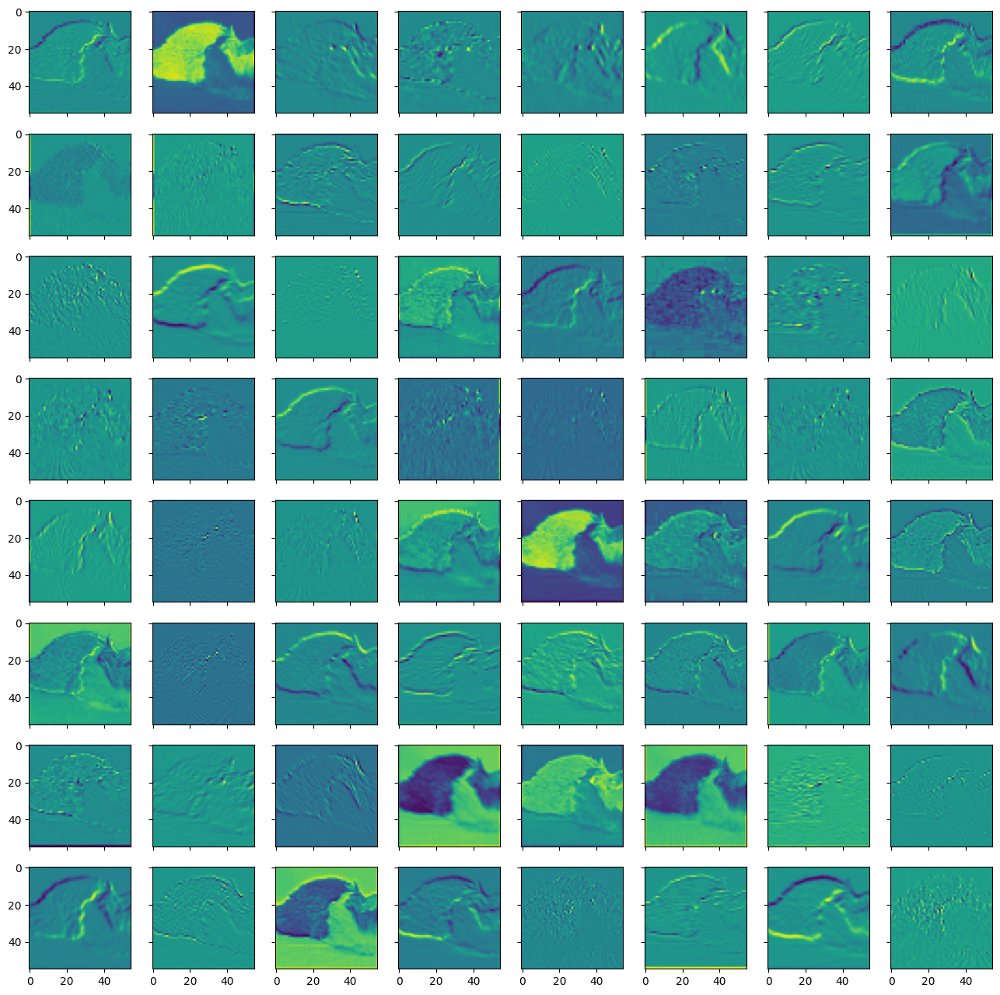

In [ ]:

fig, ax = plt.subplots(8, 8, sharex=True, sharey=True, figsize=(16,16))
for i in range(0, 64):
    row, col = i//8, i%8
    ax[row][col].imshow(feature_maps[0][i])
plt.show()

In [ ]:
AlexNetmodel.eval()
with torch.no_grad():
    feature_maps = AlexNetmodel.features[0](test_data[x][0].view(1,3,224,224).to(DEVICE))
    feature_maps = AlexNetmodel.features[1](feature_maps)
    feature_maps = AlexNetmodel.features[2](feature_maps)
    feature_maps = AlexNetmodel.features[3](feature_maps).cpu()

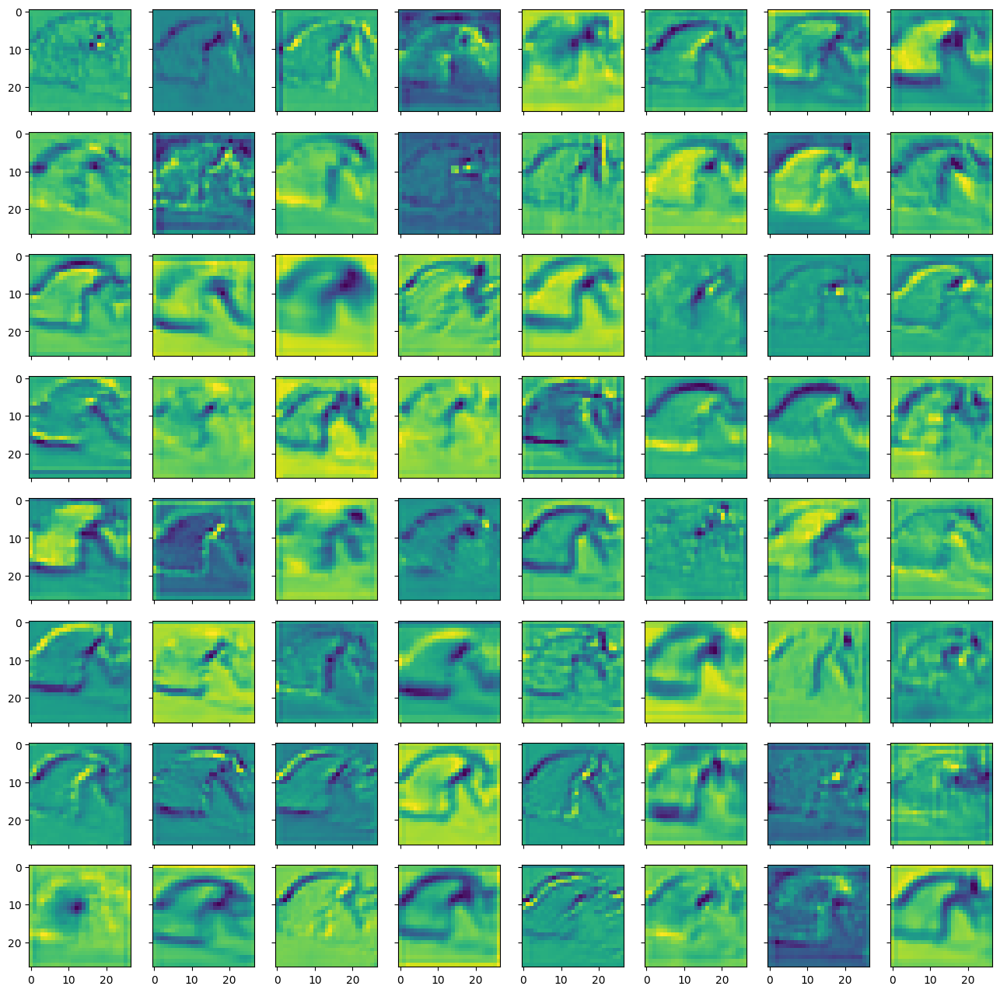

In [ ]:

fig, ax = plt.subplots(8, 8, sharex=True, sharey=True, figsize=(16,16))
for i in range(0, 64):
    row, col = i//8, i%8
    ax[row][col].imshow(feature_maps[0][i])
plt.show()

In [ ]:
!pip install torchattacks

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.3/49.3 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 142.0/142.0 kB 12.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.2/61.2 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.9/143.9 kB 11.8 MB/s eta 0:00:00
  Attempting uninstall: urllib3
    Found existing installation: urllib3 2.0.7
    Uninstalling urllib3-2.0.7:
      Successfully uninstalled urllib3-2.0.7
  Attempting uninstall: idna
    Found existing installation: idna 3.7
    Uninstalling idna-3.7:
      Successfully uninstalled idna-3.7
  Attempting uninstall: chardet
    Found existing installation: chardet 5.2.0
    Uninstalling chardet-5.2.0:
      Successfully uninstalled chardet-5.2.0
  Attempting uninstall: requests
    Found existing installation: reque

In [ ]:
import torchattacks
def fgsm_attack(eps, data_loader, model):
  #attack = torchattacks.FGSM(model, eps=eps)
  attack = torchattacks.PGD(model, eps=8/255, alpha=2/255, steps=4)
  attack.set_normalization_used(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
  attacked_images = []
  labels = []
  for image, label in tqdm(data_loader):
    image, label = image.to(DEVICE), label.to(DEVICE)
    adv_images = attack(image, label)
    attacked_images.append(adv_images)
    labels.append(label)
  return attacked_images, labels

In [ ]:
def evaluate_model_on_attack(attacked_images, labels,model,testloader):
  model.eval()
  test_loss , test_acc = 0, 0
  with torch.no_grad():
      for image, label in tqdm(zip(attacked_images, labels)):
        image, label = image.to(DEVICE), label.to(DEVICE)
        test_pred_logits = model(image)
        loss = criterion(test_pred_logits, label)
        test_loss += loss.item()
        test_pred_labels = torch.argmax(test_pred_logits,dim=1)
        test_acc += (test_pred_labels == label).sum().item() / len(label)
  test_loss /= len(testloader)
  test_acc /= len(testloader)
  print(f'Loss = {test_loss}, Acc={100 * test_acc} %')
  model.train()

In [ ]:
attacked_images, labels = fgsm_attack(eps=8 / 255, data_loader=test_loader, model=AlexNetmodel)
evaluate_model_on_attack(attacked_images=attacked_images, labels=labels,model=AlexNetmodel,testloader=test_loader)

100%|██████████| 196/196 [00:38<00:00,  5.08it/s]
196it [00:01, 144.17it/s]

Loss = 58.40102296946, Acc=0.0 %


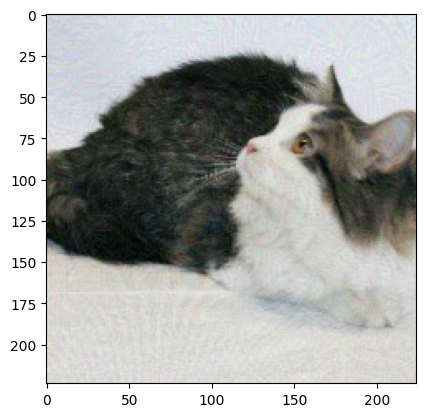

In [ ]:
sample=attacked_images[63][3].cpu()
im = inv_normalize(sample)
plt.imshow(np.transpose(im.numpy(), (1, 2, 0)));

In [ ]:
with torch.no_grad():
    new_pred = AlexNetmodel(sample.view(1,3,224,224).to(DEVICE)).argmax()
print(f'Predicted value: {new_pred.item()} {class_names[new_pred.item()]}')

Predicted value: 1 DOG


In [ ]:
with torch.no_grad():
    feature_maps = AlexNetmodel.features[0](sample.view(1,3,224,224).to(DEVICE)).cpu()

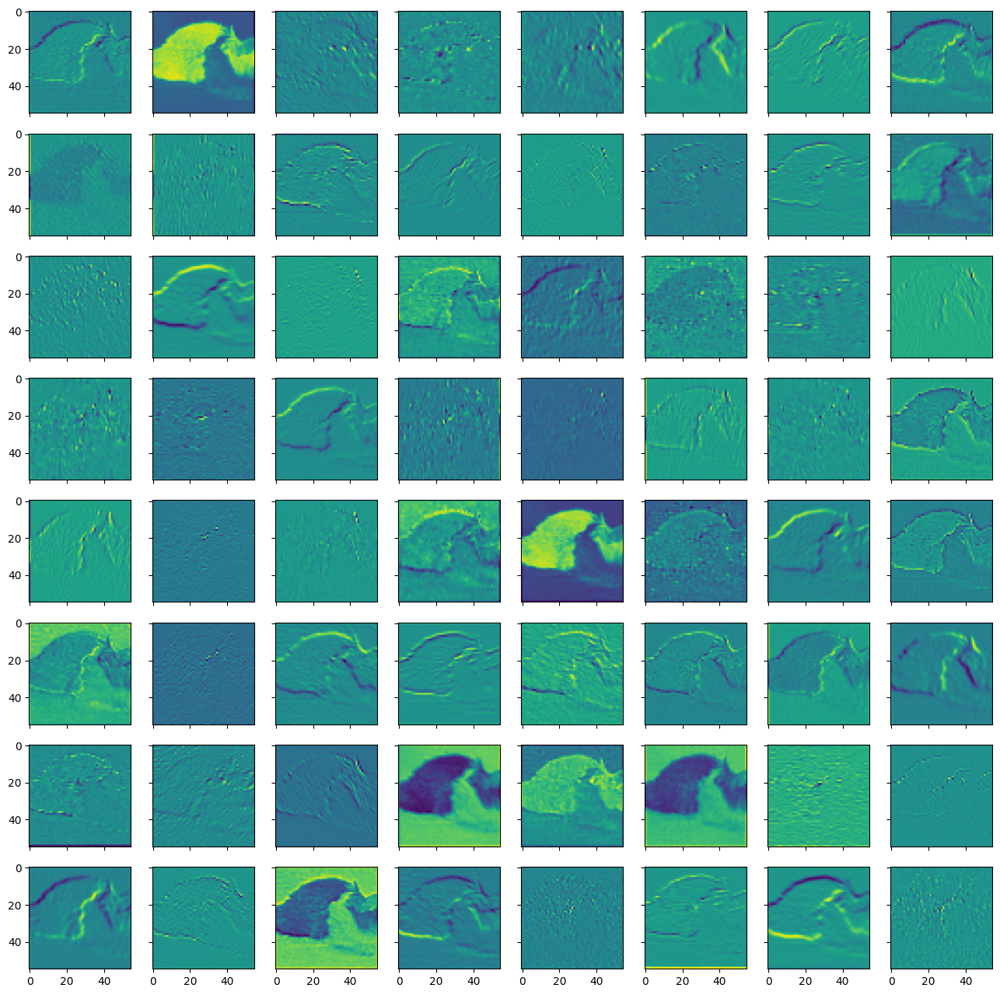

In [ ]:
fig, ax = plt.subplots(8, 8, sharex=True, sharey=True, figsize=(16,16))
for i in range(0, 64):
    row, col = i//8, i%8
    ax[row][col].imshow(feature_maps[0][i])
plt.show()

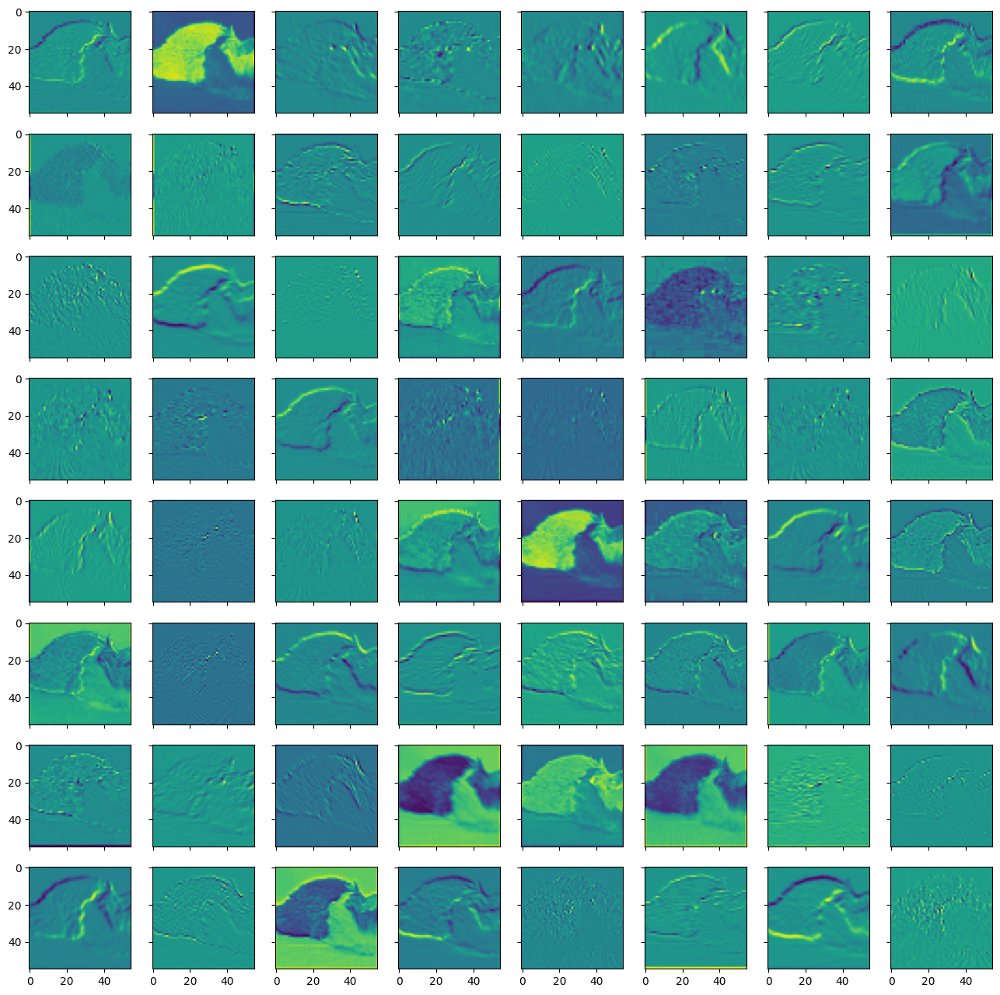

In [ ]:
AlexNetmodel.eval()
with torch.no_grad():
    feature_maps = AlexNetmodel.features[0](test_data[x][0].view(1,3,224,224).to(DEVICE)).cpu()
fig, ax = plt.subplots(8, 8, sharex=True, sharey=True, figsize=(16,16))
for i in range(0, 64):
    row, col = i//8, i%8
    ax[row][col].imshow(feature_maps[0][i])
plt.show()

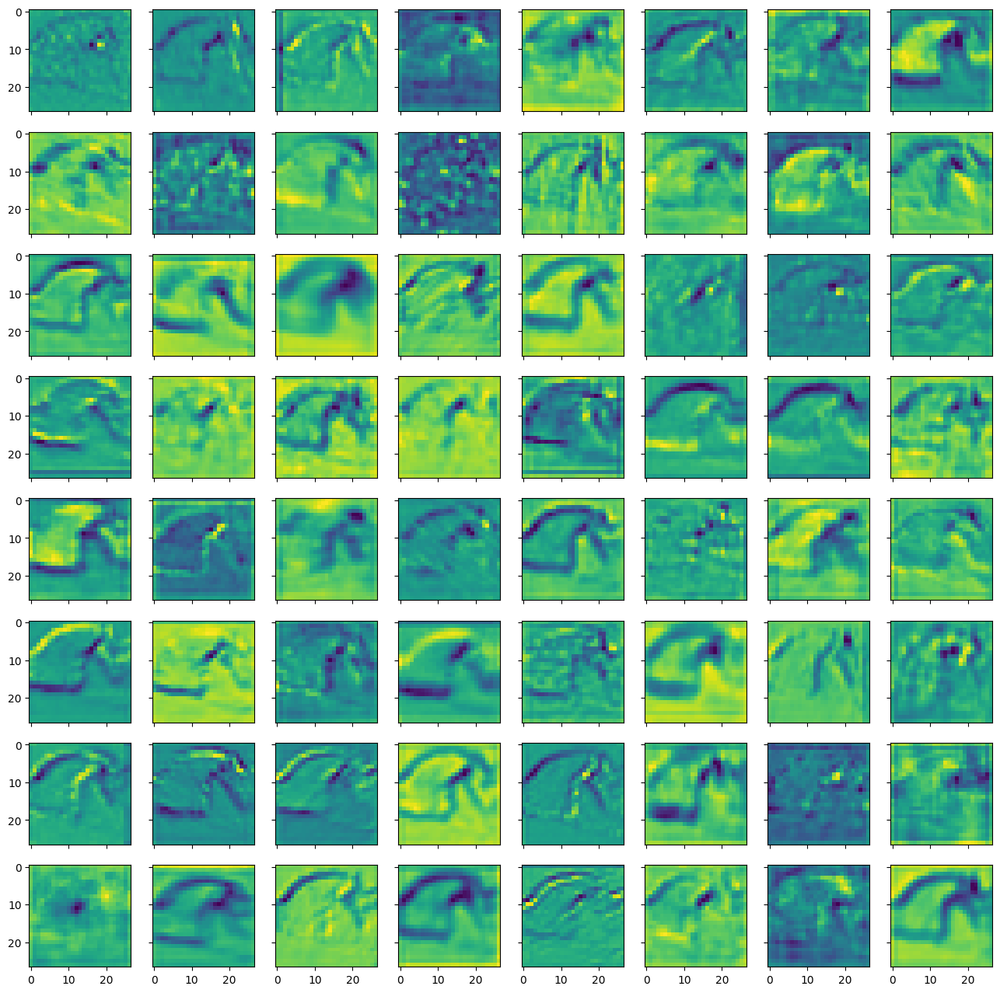

In [ ]:
AlexNetmodel.eval()
with torch.no_grad():
    feature_maps = AlexNetmodel.features[0](sample.view(1,3,224,224).to(DEVICE))
    feature_maps = AlexNetmodel.features[1](feature_maps)
    feature_maps = AlexNetmodel.features[2](feature_maps)
    feature_maps = AlexNetmodel.features[3](feature_maps).cpu()
fig, ax = plt.subplots(8, 8, sharex=True, sharey=True, figsize=(16,16))
for i in range(0, 64):
    row, col = i//8, i%8
    ax[row][col].imshow(feature_maps[0][i])
plt.show()

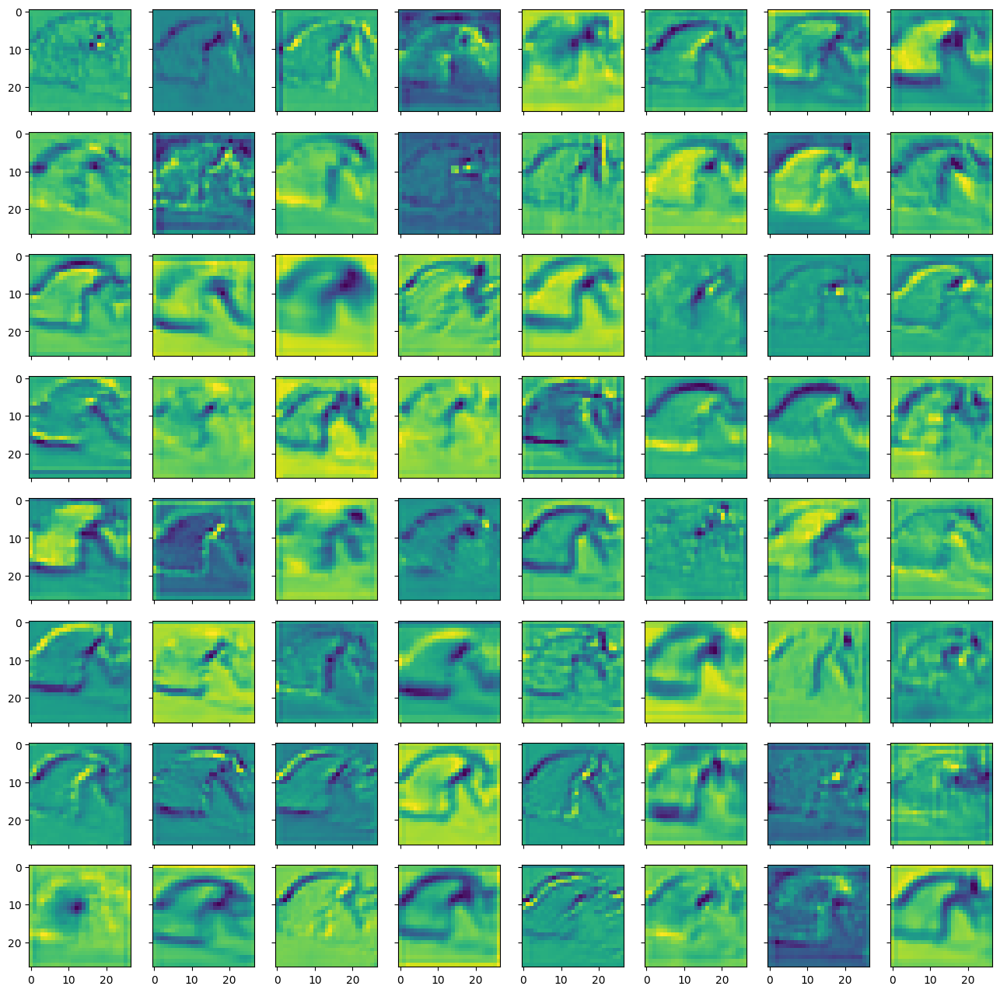

In [ ]:
AlexNetmodel.eval()
with torch.no_grad():
    feature_maps = AlexNetmodel.features[0](test_data[x][0].view(1,3,224,224).to(DEVICE))
    feature_maps = AlexNetmodel.features[1](feature_maps)
    feature_maps = AlexNetmodel.features[2](feature_maps)
    feature_maps = AlexNetmodel.features[3](feature_maps).cpu()
fig, ax = plt.subplots(8, 8, sharex=True, sharey=True, figsize=(16,16))
for i in range(0, 64):
    row, col = i//8, i%8
    ax[row][col].imshow(feature_maps[0][i])
plt.show()